In [ ]:
# Install dependencies
!pip install numpy tqdm matplotlib
!pip install import_ipynb

In [ ]:
# %matplotlib widget
import numpy as np
from tqdm.notebook import tqdm
from matplotlib import pyplot as plt
import import_ipynb
import aux_functions as auxf
import os

importing Jupyter notebook from aux_functions.ipynb


First of all we will load our dataset via our [read_nc](aux_functions.ipynb#read_nc) function.

In [ ]:
ncs = [f"ridgecrest/{file}" for file in os.listdir("ridgecrest") if ".nc" in file]
ncs_data = [auxf.read_nc(file) for file in ncs]

# Visualisation
This is a little snippet of code (most of it is messing with display settings) to display all of the data we will use down below to remove noise and showcase different interpretations.

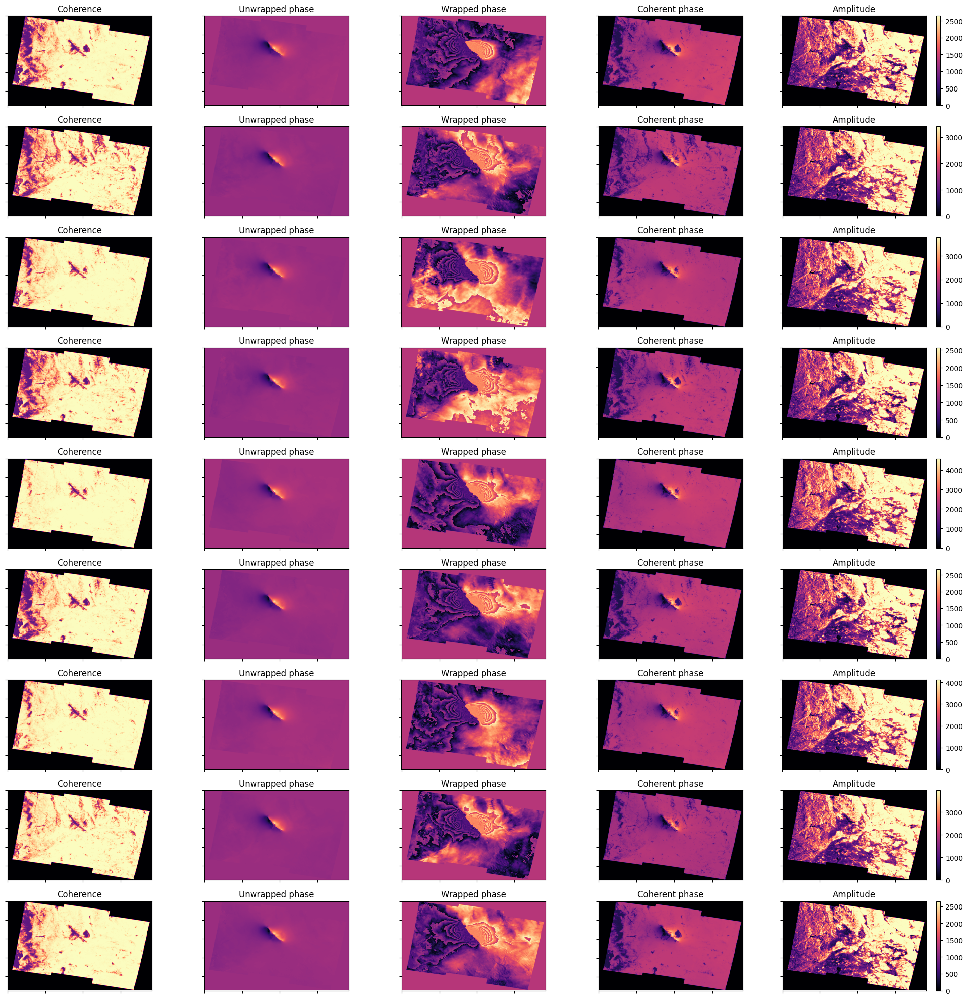

In [ ]:
fig, axs = plt.subplots(len(ncs_data), 5, figsize=(20,20))

for i, (_, unwrapped_phase, coherence, amplitude, _, _) in enumerate(ncs_data):
    coherent_phase = auxf.coherentise(unwrapped_phase, coherence)
    wrapped_phase = np.fmod(unwrapped_phase, 2*np.pi)
    amplitude = np.clip(amplitude, 0, np.percentile(amplitude, 70))

    axs[i, 0].imshow(coherence, cmap="magma")
    axs[i, 0].set_title("Coherence")
    axs[i, 0].set_xticklabels([])
    axs[i, 0].set_yticklabels([])

    axs[i, 1].imshow(unwrapped_phase, cmap="magma")
    axs[i, 1].set_title("Unwrapped phase")
    axs[i, 1].set_xticklabels([])
    axs[i, 1].set_yticklabels([])

    axs[i, 2].imshow(wrapped_phase, cmap="magma")
    axs[i, 2].set_title("Wrapped phase")
    axs[i, 2].set_xticklabels([])
    axs[i, 2].set_yticklabels([])

    axs[i, 3].imshow(coherent_phase, cmap="magma")
    axs[i, 3].set_title("Coherent phase")
    axs[i, 3].set_xticklabels([])
    axs[i, 3].set_yticklabels([])

    img4 = axs[i, 4].imshow(amplitude, cmap="magma")
    axs[i, 4].set_title("Amplitude")
    axs[i, 4].set_xticklabels([])
    axs[i, 4].set_yticklabels([])
    plt.colorbar(img4, ax=axs[i, 4])

fig.tight_layout()


# Coherent phase and amplitude.
We can use amplitude as a rough terrain map, while using phase to visualize small displacements between the phases of the two images taken by the InSAR satellite.
Here blue and red mean there's been displacement (each in one direction), while green means nothing has moved. You can see there's no displacement in most places, but some big displacement around a line in the middle (which is where the ground basically split apart).
There's also some noise on top of the mountains on the left. We'll get rid of it in a bit.

Each graph is a different set of two InSAR images.

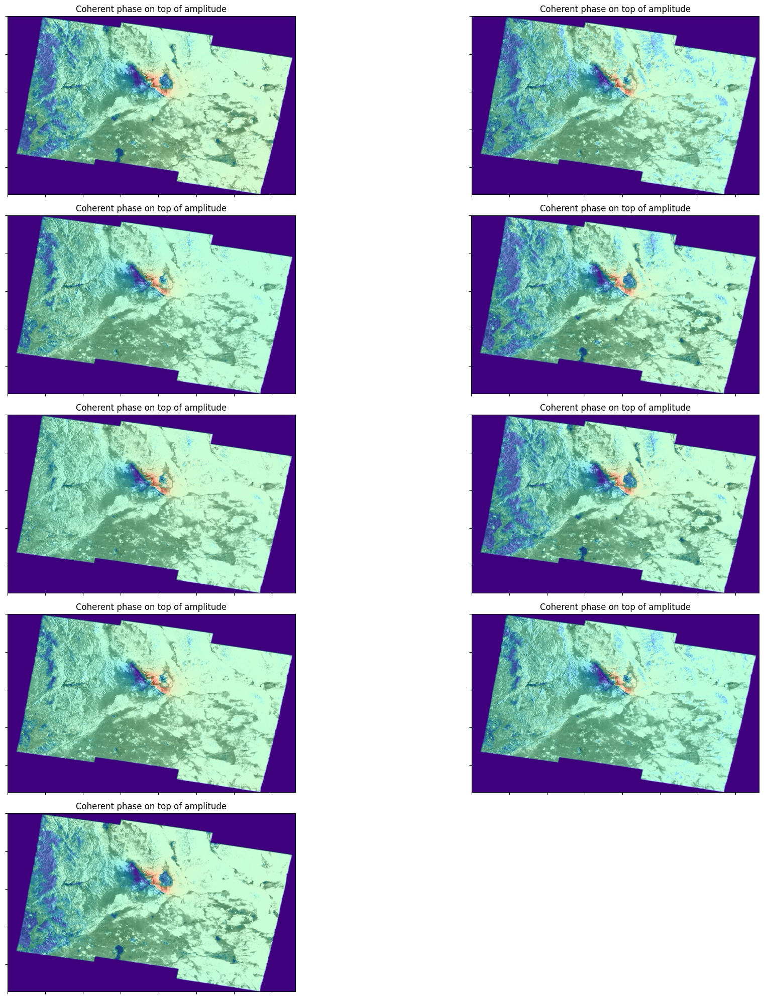

In [ ]:
fig, axs = plt.subplots(int(len(ncs_data)/2+0.5), 2, figsize=(20,20))

for i, (_, unwrapped_phase, coherence, amplitude, _, _) in enumerate(ncs_data):
    coherent_phase = auxf.coherentise(unwrapped_phase, coherence)
    amplitude = np.clip(amplitude, 0, np.percentile(amplitude, 70))
    # wrapped_phase_mat = np.fmod(unwrapped_phase_mat, 2*np.pi)
    
    axs[i//2, i%2].set_xticklabels([])
    axs[i//2, i%2].set_yticklabels([])
    axs[i//2, i%2].set_title("Coherent phase on top of amplitude")

    axs[i//2, i%2].imshow(amplitude, cmap="gray", alpha=1)
    axs[i//2, i%2].imshow(coherent_phase, cmap="rainbow", alpha=0.5)
    
    
if len(ncs_data) % 2 == 1:
    fig.delaxes(axs[len(ncs_data)//2, 1])

fig.tight_layout()

# Noise!
Calculating the difference between two phases we can see there places where the resulting image is 0 are the same between the two images, while the places that have a value are different.

We can also take the absolute of the difference so we see all differences as blue points (easier to see).

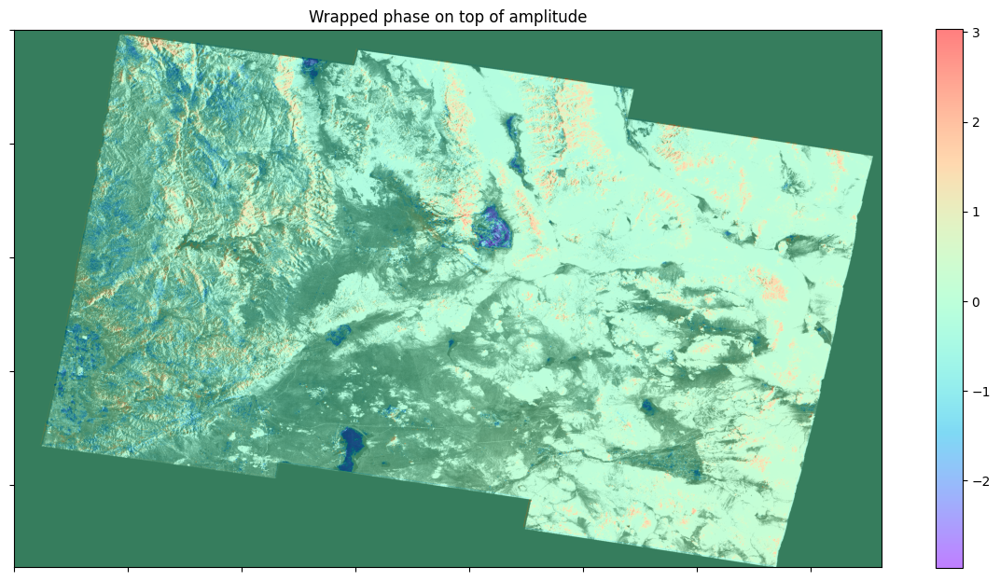

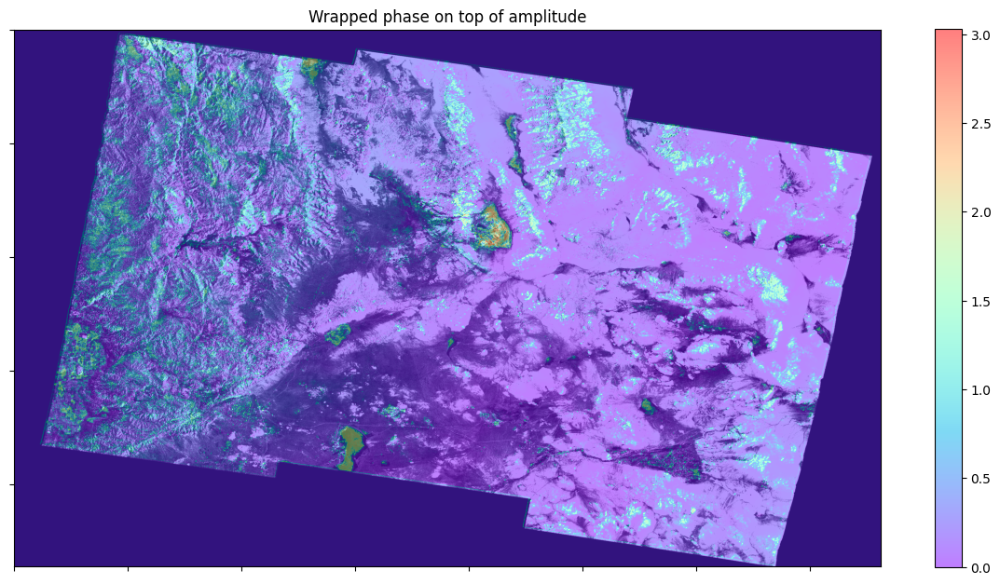

In [ ]:
nc1 = ncs_reshaped[0]
(_, uwphase1, coherence1, amplitude1, _, _) = nc1
nc2 = ncs_reshaped[1]
(_, uwphase2, coherence2, amplitude2, _, _) = nc2

cphase1 = auxf.coherentise(uwphase1, coherence1)
cphase2 = auxf.coherentise(uwphase2, coherence2)

diff = cphase1-cphase2
diff = auxf.normalize(diff)
diff *= (2*np.pi)
diff -= np.pi

amplitude = np.clip(amplitude1, 0, np.percentile(amplitude1, 70))

auxf.draw_phase_amplitude(diff, amplitude, title="Difference of phases (error)", ticks=False)
plt.show()

diff = np.abs(diff)
auxf.draw_phase_amplitude(diff, amplitude, title="Blown up difference of phases" ticks=False)

plt.show()

# Fix noise
We can fix that noise by doing a simple average between all the images. This is the real ground movement that happened during the Ridgecrest earthquake.

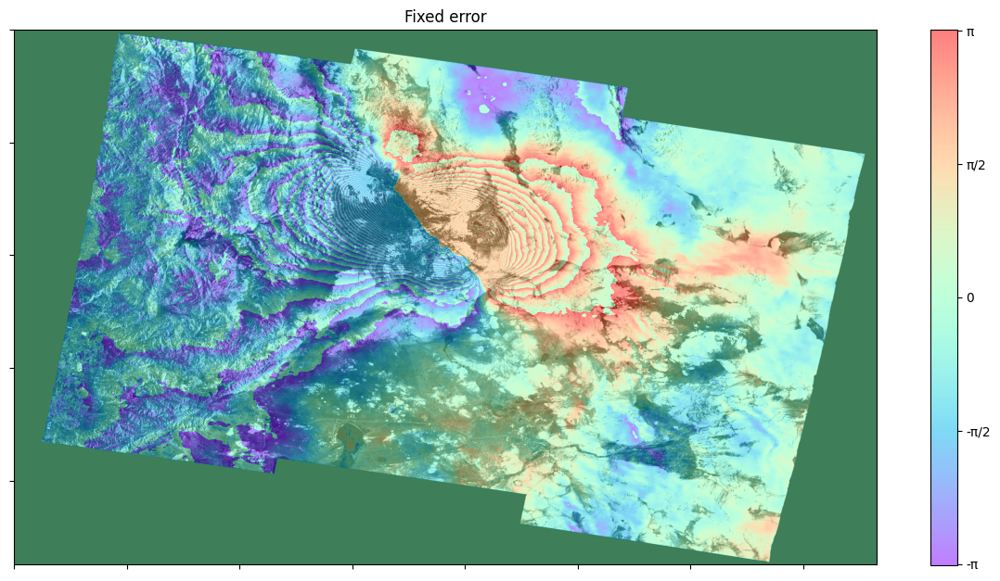

In [ ]:
ncs_reshaped = auxf.reshape(ncs_data)

phases = []
coherences = []
for i, (_, unwrapped_phase, coherence, _, _, _) in enumerate(ncs_reshaped):
    phases.append(unwrapped_phase)
    coherences.append(coherence)

_, _, _, amplitude, _, _ = ncs_reshaped[0]
amplitude = np.clip(amplitude1, 0, np.percentile(amplitude1, 70))
av_phases = np.sum(phases, axis=0)/len(phases)

fig = auxf.draw_phase_amplitude(av_phases, amplitude, title="Fixed error")
fig.savefig("FixedError.png")